# Example Twins analysis
Plot distances, calculate model performance, view feature difference maps, saliency maps, and cluster extracted differential features! These examples are from Kubo et al. CTCF degron dataset.

In [2]:
import sys
import random
import numpy as np
import pandas as pd
import torch
import torch.nn.functional as F
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.colors as colors
from scipy.ndimage import rotate
from skimage.transform import resize
import json
import hicstraw
from torch.utils.data import Dataset, DataLoader, SequentialSampler, Subset
from HiSiNet.HiCDatasetClass import HiCDataset, HiCDatasetDec, SiameseHiCDataset, PairOfDatasets, GroupedHiCDataset
from HiSiNet.reference_dictionaries import reference_genomes
from HiSiNet import models
from HiSiNet.visualisation import plot_chromosome_distances_middle_bin, plot_hic_cnn_features, plot_smoothed_distance_hist, analyze_and_plot_hic_tiles, plot_hic_region
from matplotlib.ticker import MultipleLocator
import pickle
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans
from matplotlib.offsetbox import OffsetImage, AnnotationBbox
from sklearn.metrics import silhouette_score


# Set seed
random.seed(3004)

In [3]:
# load some feature maps
SLeNet_ctcf_features_contrastive_bs16_final_normalised = HiCDatasetDec.load("feature_maps/D4_CTCF_features_contrastive_lenet_0_aug_bs16_final_saliency.fmlhic")
SLeNet_ctcf_features_contrastive_bs32_final_normalised = HiCDatasetDec.load("feature_maps/ctcf_degron_bs32_contrastive_0_aug_LeNet_no_saliency.fmlhic")
#SLeNet_ctcf_features_contrastive_bs32_final_normalised_bad = HiCDatasetDec.load("feature_maps/ctcf_degron_bs32_contrastive_0_aug.fmlhic")

print("loaded features")
# Load Hi-C files 
reference_genome = "mm10"

filter_index=["all"]

output_distance_folder="distances/"

hic_files = {
    "WT": [
        ("CTCF_D4_NPC_CTRL_R1", "/home/tt920/mnt/network/lymphdev/Tim/GSM4386026_hic_d4_ctl_rep1.hic"),
        ("CTCF_D4_NPC_CTRL_R2", "/home/tt920/mnt/network/lymphdev/Tim/GSM4386027_hic_d4_ctl_rep2.hic")
    ],
    "KO": [
        ("CTCF_D4_NPC_KO_R1", "/home/tt920/mnt/network/lymphdev/Tim/GSM4386028_hic_d4_aux_rep1.hic"),
        ("CTCF_D4_NPC_KO_R2", "/home/tt920/mnt/network/lymphdev/Tim/GSM4386029_hic_d4_aux_rep2.hic")
    ]
}

# Load mlhic
json_file = "D4_CTCF_224.json"

with open(json_file) as json_file:
    dataset = json.load(json_file)
all_paths = []
for key in dataset:
    all_paths.extend(dataset[key].get("all", []))

# Load all datasets
mlhic_dataset = [HiCDatasetDec.load(p) for p in all_paths]

print("loaded mlhic")
# Define model checkpoint

SLeNet_contrastive_ctcf_0_aug_checkpoint_bs32 = "model_outputs/ctcf_final/SLeNet_CTCF_final_0.0001_32_contrastive_30004_Adam_0_aug_.ckpt"
best_contrastive_ctcf_maxvit_model = "model_outputs/ctcf_final/maxvit/contrastive_triplet/SMaxVit_CTCF_final_0.0001_32_contrastive_30004_Adam_0_aug_final.ckpt"


loaded features
loaded mlhic


## Distance plotting

### Plotting function overview

#### Function Overview: `plot_chromosome_distances_middle_bin`

This function plots **chromosome-wide embedding distances** from a Siamese Hi-C model.  
It can either:

1. **Compute distances on-the-fly** using a trained model + dataset, or  
2. **Load pre-computed distances** from a CSV / DataFrame (This is much faster and so preferable 

Distances are plotted at the **middle bin position** of each Hi-C tile, providing a one-to-one link between genomic position and embedding distance.

---

#### Key Options

- **Data source**  
  - `mlhic_dataset`, `model_ckpt_path`, `reference_genome` → compute distances directly.  
  - `csv_path` / `csv_data` → load pre-computed distances (faster).

- **Chromosome selection**  
  - `target_chrom=None` → plot all chromosomes (separate subplots).  
  - `target_chrom="chr1"` → plot a specific chromosome.  

- **Distance measure** (`distance_measure`)  
  - `"pairwise"` → Euclidean (L2) distance between embeddings.  
  - `"cosine"` → 1 - cosine similarity (orientation difference in embedding space).  

- **Genomic window**  
  - `mb_start`, `mb_end` → restrict to a region (in megabases).  
  - Positions shown are **middle bin positions** of each input window.  

- **Resolution & stride**  
  - `bin_size` → Hi-C resolution in bp.  
  - `patch_len` → number of bins per input tile.  
  - `position_stride` → subsampling (e.g. 10 = plot every 10th window).  

- **Plotting options**  
  - `show_difference_plot=True` → adds a “twins score” panel = (between - within) distance difference across the chromosome.  
  - `figsize`, `font_scale`, `font_size` → control figure size and style.  
  - `major_tick_interval` → Mb spacing on the x-axis.  

---

#### What the plots show

1. **Main plot (per chromosome):**  
   - Distance curves for **within** vs **between** pairs of Hi-C tiles.  
   - X-axis = genomic position (Mb), Y-axis = embedding distance.  
   - Helps visualize where embeddings separate biological replicates/conditions.

2. **Difference plot (optional):**  
   - Shows the mean difference between *between* vs *within* distances (`Δ distance`).  
   - Highlights regions where embeddings best capture biological differences.

### Some plotting examples

Calculating distances on-the-fly...
Loading model from: model_outputs/ctcf_final/SLeNet_CTCF_final_0.0001_32_contrastive_30004_Adam_0_aug_.ckpt
Calculating distances for single chromosome: chr2

Processing chromosome chr2...
Found 3657 samples for chromosome chr2
Running model inference...
  Processing batch 1/37
  Processing batch 6/37
  Processing batch 11/37
  Processing batch 16/37
  Processing batch 21/37
  Processing batch 26/37
  Processing batch 31/37
  Processing batch 36/37
Processing genomic positions...
Created DataFrame with 3657 rows for chr2 (middle bin positions)

Combined data: 3657 total rows across 1 chromosomes
Starting plotting...
Plotting single chromosome: chr2
Subsampling every 1 positions for chr2...
Selected 3657 positions for plotting chr2


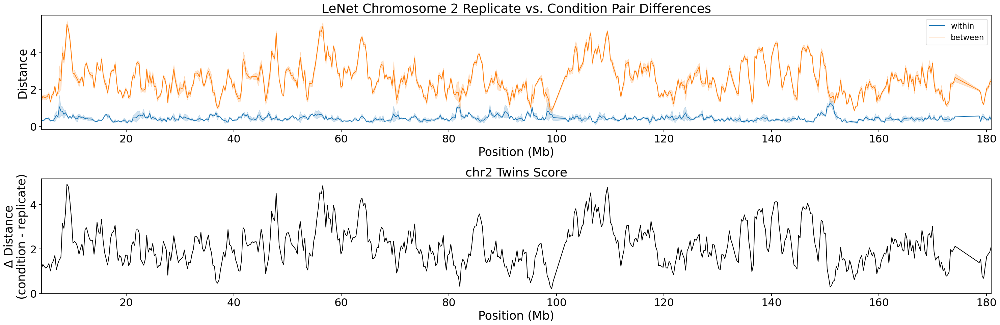

In [5]:
plot_chromosome_distances_middle_bin(
    mlhic_dataset=mlhic_dataset,                      
    model_ckpt_path=SLeNet_contrastive_ctcf_0_aug_checkpoint_bs32,
    model_name="SLeNet",
    reference_genome = "mm10",    
    target_chrom="chr2",
    loss_function = "contrastive",
    distance_measure="pairwise",
    position_stride=1,
    patch_len=224,
    major_tick_interval=20,
    font_scale=1.5,
    font_size=25,
    title = "LeNet Chromosome 2 Replicate vs. Condition Pair Differences",
    show_difference_plot=True)                 

Loading pre-calculated distances from: distances/CTCF_degron/SMaxVit_CTCF_final_0.0001_32_contrastive_30004_Adam_0_aug_final_pairwise_distances_raw.csv
Starting plotting...
Plotting single chromosome: chr2
Subsampling every 1 positions for chr2...
Selected 3657 positions for plotting chr2


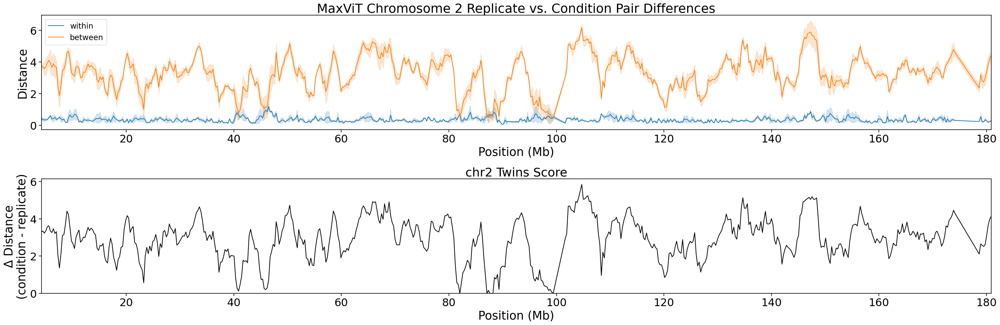

In [8]:
plot_chromosome_distances_middle_bin(
    mlhic_dataset=mlhic_dataset,                      
    csv_path="distances/CTCF_degron/SMaxVit_CTCF_final_0.0001_32_contrastive_30004_Adam_0_aug_final_pairwise_distances_raw.csv",
    target_chrom="chr2",
    position_stride=1,
    patch_len=224,
    major_tick_interval=20,
    font_scale=1.5,
    font_size=25,
    title = "MaxViT Chromosome 2 Replicate vs. Condition Pair Differences",
    show_difference_plot=True)                 

#### You can also just plot a desired Mb range or all chromosomes

Loading pre-calculated distances from: distances/CTCF_degron/SMaxVit_CTCF_final_0.0001_32_contrastive_30004_Adam_0_aug_final_pairwise_distances_raw.csv
Starting plotting...
Plotting single chromosome: chr2
Filtered chr2 to >= 100 Mb: 1611 rows
Filtered chr2 to <= 110 Mb: 180 rows
Subsampling every 1 positions for chr2...
Selected 180 positions for plotting chr2


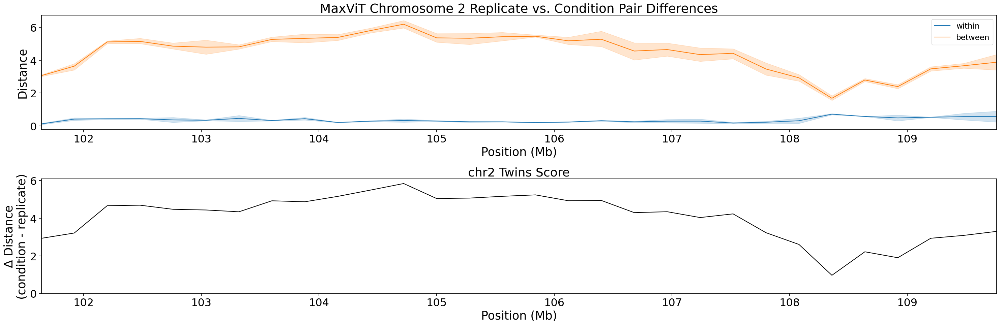

In [6]:
plot_chromosome_distances_middle_bin(
    mlhic_dataset=mlhic_dataset,                      
    csv_path="distances/CTCF_degron/SMaxVit_CTCF_final_0.0001_32_contrastive_30004_Adam_0_aug_final_pairwise_distances_raw.csv",
    target_chrom="chr2",
    mb_start= 100,
    mb_end= 110,
    position_stride=1,
    patch_len=224,
    major_tick_interval=1,
    font_scale=1.5,
    font_size=25,
    title = "MaxViT Chromosome 2 Replicate vs. Condition Pair Differences",
    show_difference_plot=True)                 

Loading pre-calculated distances from: distances/CTCF_degron/SMaxVit_CTCF_final_0.0001_32_contrastive_30004_Adam_0_aug_final_pairwise_distances_raw.csv
Starting plotting...
Plotting all chromosomes: ['chr1', 'chr2', 'chr3', 'chr4', 'chr5', 'chr6', 'chr7', 'chr8', 'chr9', 'chr10', 'chr11', 'chr12', 'chr13', 'chr14', 'chr15', 'chr16', 'chr17', 'chr18', 'chr19']
Subsampling every 1 positions for chr1...
Selected 4086 positions for plotting chr1
Subsampling every 1 positions for chr2...
Selected 3657 positions for plotting chr2
Subsampling every 1 positions for chr3...
Selected 3282 positions for plotting chr3
Subsampling every 1 positions for chr4...
Selected 2934 positions for plotting chr4
Subsampling every 1 positions for chr5...
Selected 2958 positions for plotting chr5
Subsampling every 1 positions for chr6...
Selected 3054 positions for plotting chr6
Subsampling every 1 positions for chr7...
Selected 2520 positions for plotting chr7
Subsampling every 1 positions for chr8...
Selected

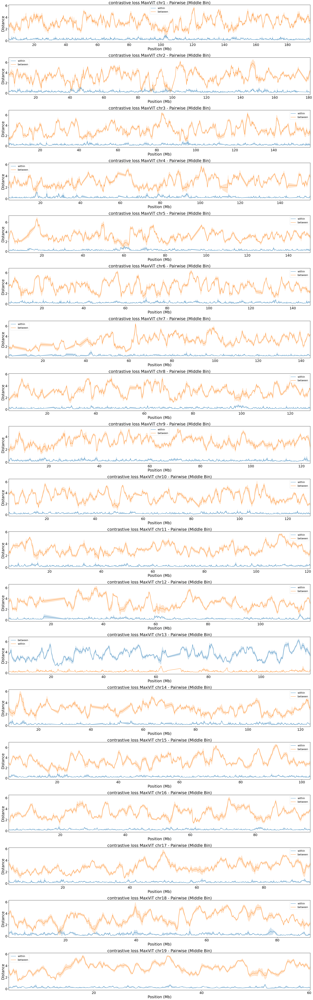

In [10]:
plot_chromosome_distances_middle_bin(
    mlhic_dataset=mlhic_dataset,                      
    csv_path="distances/CTCF_degron/SMaxVit_CTCF_final_0.0001_32_contrastive_30004_Adam_0_aug_final_pairwise_distances_raw.csv",
    model_name="MaxViT",
    loss_function = "contrastive",
    distance_measure="pairwise", 
    position_stride=1,
    patch_len=224,
    major_tick_interval=20,
    font_scale=1.5,
    font_size=25,
    show_difference_plot=False)                 

## Calculate model performance metrics

In [11]:
bs32_0_aug_maxvit_distances = pd.read_csv("distances/CTCF_degron/SMaxVit_CTCF_final_0.0001_32_contrastive_30004_Adam_0_aug_final_pairwise_distances_raw.csv")  
bs32_0_aug_lenet_distances = pd.read_csv('distances/SLeNet_CTCF_final_0.0001_32_contrastive_30004_Adam_0_aug__pairwise_distances_raw.csv') 

In [12]:
bs32_0_aug_maxvit_distances_test = bs32_0_aug_maxvit_distances[bs32_0_aug_maxvit_distances["Chromosome"]=="chr2"] # Filter to test chromosome
bs32_0_aug_lenet_distances_test = bs32_0_aug_lenet_distances[bs32_0_aug_lenet_distances["Chromosome"]=="chr2"]

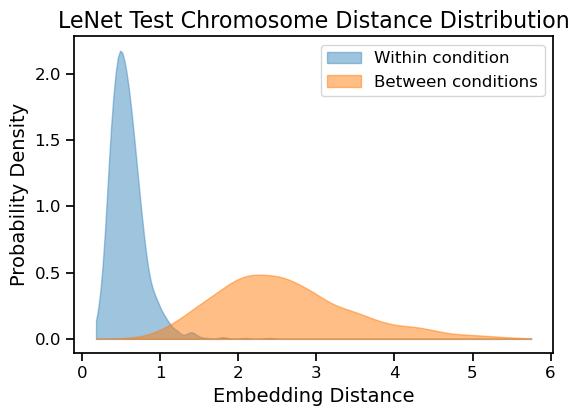

Intersection threshold: 1.130472741522764
Replicate rate:  97.87%
Condition rate:  98.07%
Mean performance: 97.97%
Separation index: 95.16%


np.float64(1.130472741522764)

In [15]:
plot_smoothed_distance_hist(bs32_0_aug_lenet_distances_test, title="LeNet Test Chromosome Distance Distribution")

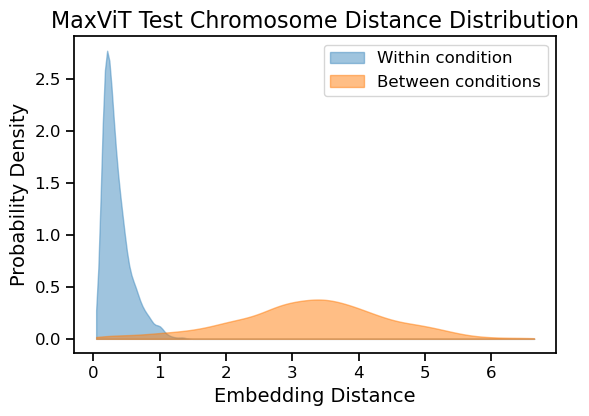

Intersection threshold: 1.0874814201590448
Replicate rate:  99.43%
Condition rate:  95.78%
Mean performance: 97.60%
Separation index: 95.33%


np.float64(1.0874814201590448)

In [14]:
plot_smoothed_distance_hist(bs32_0_aug_maxvit_distances_test, title="MaxViT Test Chromosome Distance Distribution")

## Investigate specific regions of change

### Visualise the desired region

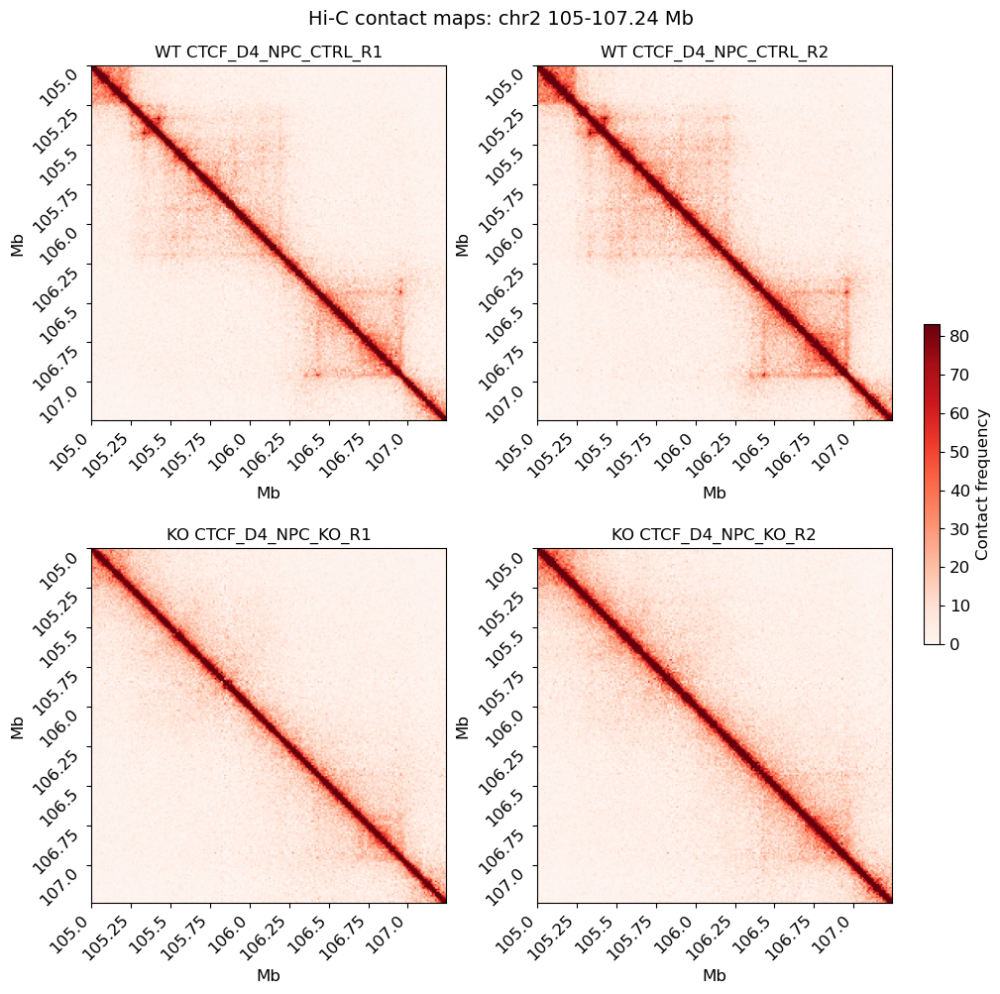

In [6]:
plot_hic_region(
    hic_files,
    chrom="chr2",
    start_mb=105,
    end_mb=105+2.24,
    bin_size=10000,
    norm="KR",
    matrix_type="observed",
    mb_per_tick=0.25,
        vmin_pct=0,
    vmax_pct=98, # clipping top values for better visualisation
)

### Perform Saliency Mapping for the desired region

Extracting tile 1: CTCF_D4_NPC_CTRL_R1
Using WT file: CTCF_D4_NPC_CTRL_R1
Extracting tile 2: CTCF_D4_NPC_KO_R1
Using KO file: CTCF_D4_NPC_KO_R1
Embedding Distance: 3.5241
Features extracted successfully
Computing saliency maps...
Saliency maps computed successfully


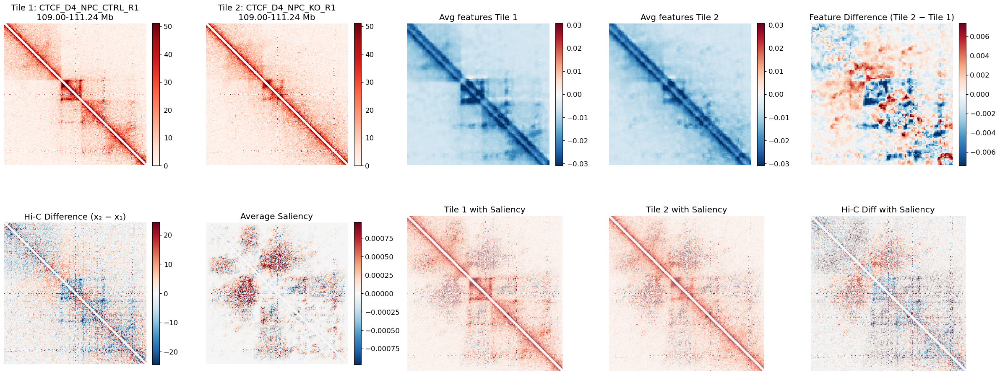

In [13]:
#Load your model
model = models.SLeNet(mask=True)
model.load_state_dict(torch.load(
    SLeNet_contrastive_ctcf_0_aug_checkpoint_bs32,
    map_location="cpu"
), strict=False)
model.eval()

analyze_and_plot_hic_tiles(
        model=model,
        hic_files=hic_files,  # Your hic_files dictionary
        chrom='chr2',
        start_mb=109.0,
        tile1_file='CTCF_D4_NPC_CTRL_R1', # Use the exact keys from the hic_files dictionary
        tile2_file='CTCF_D4_NPC_KO_R1',
        bin_size=10000,
        matrix_type="observed", # hicstraw matrix type ("observed", "oe", …)
        norm="KR", # hicstraw normalization method ("KR", "VC", etc.)
        distance_measure="pairwise", # "pairwise" (Euclidean) or "cosine" (1-cosine). only use Cosine for supcon models
        n_steps=5) # number of integration steps for Integrated Gradients 

Extracting tile 1: CTCF_D4_NPC_CTRL_R1
Using WT file: CTCF_D4_NPC_CTRL_R1
Extracting tile 2: CTCF_D4_NPC_KO_R1
Using KO file: CTCF_D4_NPC_KO_R1
Embedding Distance: 3.3653
Feature extraction not available: 'SMaxViT' object has no attribute 'features'
Computing saliency maps...
Saliency maps computed successfully


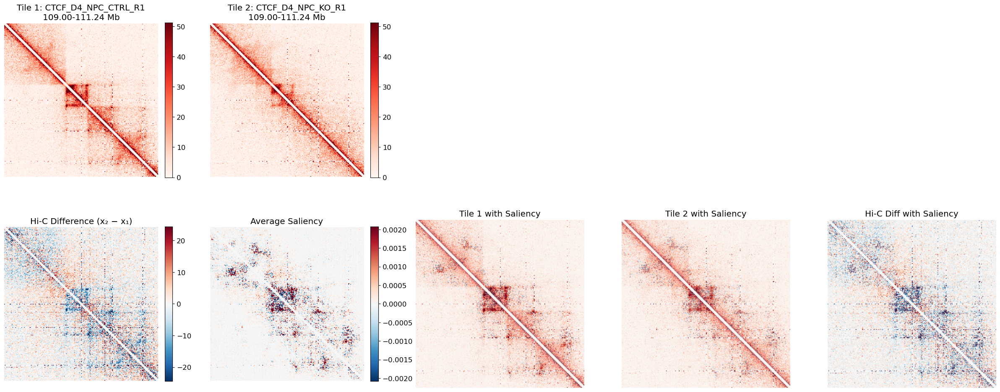

In [11]:
#Load your model
model = models.SMaxViT(mask=True) # Remember to switch to your desired model
model.load_state_dict(torch.load(
    best_contrastive_ctcf_maxvit_model,
    map_location="cpu"
), strict=False)
model.eval()

analyze_and_plot_hic_tiles(
        model=model,
        hic_files=hic_files,  # Your hic_files dictionary
        chrom='chr2',
        start_mb=109.0,
        tile1_file='CTCF_D4_NPC_CTRL_R1',
        tile2_file='CTCF_D4_NPC_KO_R1',
        bin_size=10000,
        matrix_type="observed",
        norm="KR",
        distance_measure="pairwise",
        n_steps=5)

### Visualise feature difference map with extracted features

In [4]:
# Extract features 
SLeNet_ctcf_features_contrastive_bs32_final_normalised_96_test = [] # Define extracted feature list
feature_map = SLeNet_ctcf_features_contrastive_bs32_final_normalised # Define feature map


for nfilter in filter_index:
    currfeatures = []
    for chromosome in feature_map.paired_maps.keys():
        if feature_map.paired_maps[chromosome] is None: continue
        currfeatures.extend(feature_map.extract_features(chromosome, nfilter, "conditions", qthresh=0.96))
    SLeNet_ctcf_features_contrastive_bs32_final_normalised_96_test.append(currfeatures) # replace with own extracted feature list

Analyzing chr2:105.0-115.0 Mb
Bin range: 10500-11500 (1000 bins)
Processing Hi-C data for visualization...
  KO condition:
  Loading CTCF_D4_NPC_KO_R1...
  Loading CTCF_D4_NPC_KO_R2...
  WT condition:
  Loading CTCF_D4_NPC_CTRL_R1...
  Loading CTCF_D4_NPC_CTRL_R2...
  Difference matrix shape: (707, 1000)
Extracting CNN condition map...
CNN condition map shape: (112, 1000)
Calculating CNN condition map averages along diagonal...
Computed average features from 45° and 135° diagonals for 1000 bins.
Calculating CNN condition map column averages...
Computed column averages for 1000 bins.
Aligned difference matrix shape: (112, 1000)
Actual plotting height: 112
Using legacy single model parameters...
Loading Siamese model from: model_outputs/ctcf_final/SLeNet_CTCF_final_0.0001_32_contrastive_30004_Adam_0_aug_.ckpt
Loading test dataset for Model Distance Plot...
Found 3657 samples for chromosome 2
Running model testing for Model Distance Plot...
Running model inference...
  Processing batch 1/

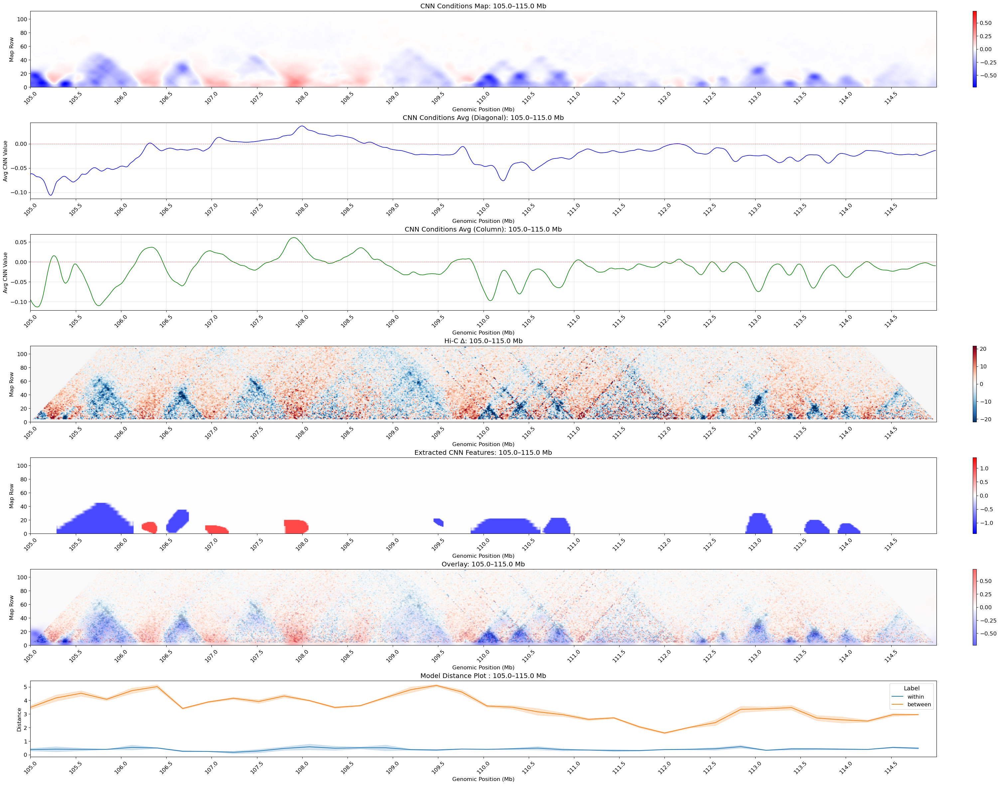

Completed plotting 1 chunks!


In [7]:
plot_hic_cnn_features(hic_files = hic_files,
    paired_maps = SLeNet_ctcf_features_contrastive_bs32_final_normalised.paired_maps,
    filter_features = SLeNet_ctcf_features_contrastive_bs32_final_normalised_96_test[0],
    model_ckpt_path = SLeNet_contrastive_ctcf_0_aug_checkpoint_bs32,
    model_name = "SLeNet",
    mlhic_dataset = mlhic_dataset,
    distance_measure = "pairwise",
    reference_genome = reference_genomes[reference_genome],
    mb_start = 105,
    mb_end = 115,
    chrom = "chr2",
    plot_windowed_hic_avg=False,  # Plot windowed change in Hi-C contacts per bin average line
    plot_cnn_diagonal_avg=True,  # Plot CNN feature difference map diagonal average line (representing change per bin in the differential feature map)
    plot_cnn_column_avg=True, # Plot CNN feature difference map column average line (representing if bin is located in region of net feature gain or loss)
    plot_saliency_conditions = False)

In [14]:
def compute_avg_feature_loss_across_genome(paired_maps, bin_size=10000):
    """
    Compute average feature change per genomic bin for all chromosomes
    in the paired_maps dictionary. Useful for downstream enrichment analysis. 
    
    Calculates:
      - avg_feature_loss: diagonal-based average (↗ + ↖)
      - vertical_avg_feature_loss: vertical average per column
    
    Parameters:
        paired_maps (dict): Dictionary of CNN condition maps per chromosome
        bin_size (int): Genomic bin size in bp (default: 10kb)
    
    Returns:
        pd.DataFrame: Chromosome, Mb_start, avg_feature_loss (calculated from doing a diagonal average to get an average intersection change per bin), 
        vertical_avg_feature_loss (calculated from doing a vertical column average per bin)
    """
    def extract_cnn_condition_map(chromosome_num, all_maps):
        cond_map = all_maps["conditions"]
        cond_sum = np.nansum(cond_map, axis=0)
        half_row = cond_sum.shape[0] // 2
        return cond_sum[half_row:, :]  # Already cropped

    all_data = []

    for chrom in paired_maps:
        chrom_num = chrom.replace("chr", "")
        all_maps = paired_maps[chrom]     
        try:
            cnn_cond_map = extract_cnn_condition_map(chrom_num, all_maps)
            print(f"Processing {chrom_num}...")
        except Exception as e:
            print(f"Skipping chromosome {chrom} due to error: {e}")
            continue

        H, W = cnn_cond_map.shape
        num_bins = W
        cnn_map_avg = np.zeros(num_bins)
        vertical_avg = np.zeros(num_bins)

        # Calculate windowed averages
        for x_pos in range(num_bins):
            diagonal_values = []

            # 45° diagonal (↗)
            for offset in range(min(W - x_pos, H)):
                x = x_pos + offset
                y = offset
                diagonal_values.append(cnn_cond_map[y, x])

            # 135° diagonal (↖)
            for offset in range(min(x_pos + 1, H)):
                x = x_pos - offset
                y = offset
                diagonal_values.append(cnn_cond_map[y, x])

            # Remove duplicates (center pixel)
            diagonal_values = list(set(diagonal_values))

            if diagonal_values:
                cnn_map_avg[x_pos] = np.nanmean(diagonal_values)
            else:
                cnn_map_avg[x_pos] = np.nan

            # Vertical average for this column
            vertical_avg[x_pos] = np.nanmean(cnn_cond_map[:, x_pos])

        # Create rows for this chromosome
        Mb_starts = np.array(range(num_bins)) * bin_size / 1e6
        df = pd.DataFrame({
            "chromosome": ["chr" + chrom] * num_bins,
            "Mb_start": Mb_starts,
            "diagonal_avg_feature_loss": cnn_map_avg,
            "vertical_avg_feature_loss": vertical_avg
        })

        all_data.append(df)

    result_df = pd.concat(all_data, ignore_index=True)
    return result_df

In [15]:
ctcf_cnn_feature_difference_map_local_scores = compute_avg_feature_loss_across_genome(SLeNet_ctcf_features_contrastive_bs32_final_normalised.paired_maps)

Skipping chromosome chr1 due to error: 'NoneType' object is not subscriptable
Skipping chromosome chr2 due to error: 'NoneType' object is not subscriptable
Skipping chromosome chr3 due to error: 'NoneType' object is not subscriptable
Skipping chromosome chr4 due to error: 'NoneType' object is not subscriptable
Skipping chromosome chr5 due to error: 'NoneType' object is not subscriptable
Skipping chromosome chr6 due to error: 'NoneType' object is not subscriptable
Skipping chromosome chr7 due to error: 'NoneType' object is not subscriptable
Skipping chromosome chr8 due to error: 'NoneType' object is not subscriptable
Skipping chromosome chr9 due to error: 'NoneType' object is not subscriptable
Skipping chromosome chr10 due to error: 'NoneType' object is not subscriptable
Skipping chromosome chr11 due to error: 'NoneType' object is not subscriptable
Skipping chromosome chr12 due to error: 'NoneType' object is not subscriptable
Skipping chromosome chr13 due to error: 'NoneType' object is 

In [ ]:
ctcf_cnn_feature_difference_map_local_scores.to_csv("ctcf_cnn_feature_difference_map_local_scores.csv", index=False)

## Cluster Features

In [21]:
# Extract images from list
extracted_feature_list = SLeNet_ctcf_features_contrastive_bs32_final_normalised_96_test # Replace with own list

filter_index=["all"]
list_of_images = []
for i,nfilter in enumerate(filter_index):
    for name, features in [("CTCF",extracted_feature_list)]: 
        curr=[(img_mets[1])*np.max(img_mets[1]) for img_mets in features[i]]
        list_of_images.extend(curr)

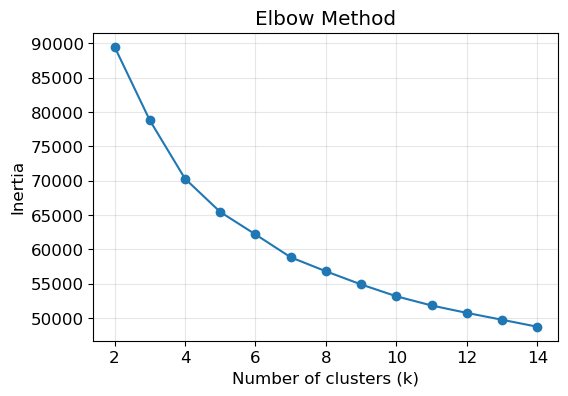

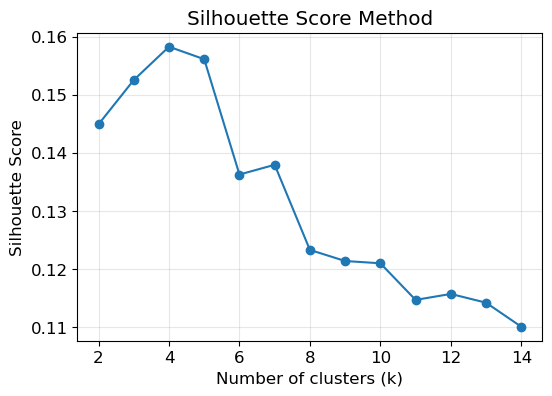

Best k by silhouette score: 4


In [29]:
# Select optimal number of clusters
X_train = np.array(list_of_images)
# Flatten images for clustering
flat_X = X_train.reshape(len(X_train), -1)

# ==== 1. Elbow Method ====
inertias = []
K_range = range(2, 15)  # test a reasonable range
for k in K_range:
    kmeans = KMeans(n_clusters=k, random_state=40, n_init=10)
    kmeans.fit(flat_X)
    inertias.append(kmeans.inertia_)

plt.figure(figsize=(6, 4))
plt.plot(K_range, inertias, marker='o')
plt.title("Elbow Method")
plt.xlabel("Number of clusters (k)")
plt.ylabel("Inertia")
plt.grid(True, alpha=0.3)
plt.show()

# ==== 2. Silhouette Method ====
sil_scores = []
for k in K_range:
    kmeans = KMeans(n_clusters=k, random_state=40, n_init=10)
    labels = kmeans.fit_predict(flat_X)
    score = silhouette_score(flat_X, labels)
    sil_scores.append(score)

plt.figure(figsize=(6, 4))
plt.plot(K_range, sil_scores, marker='o')
plt.title("Silhouette Score Method")
plt.xlabel("Number of clusters (k)")
plt.ylabel("Silhouette Score")
plt.grid(True, alpha=0.3)
plt.show()

# ==== 3. Choose k ====
# Example: choose the k with max silhouette score
best_k = K_range[np.argmax(sil_scores)]
print(f"Best k by silhouette score: {best_k}")

# Pick optimal number of clusters using combination of elbow/sillhouette score and also just visual inspection


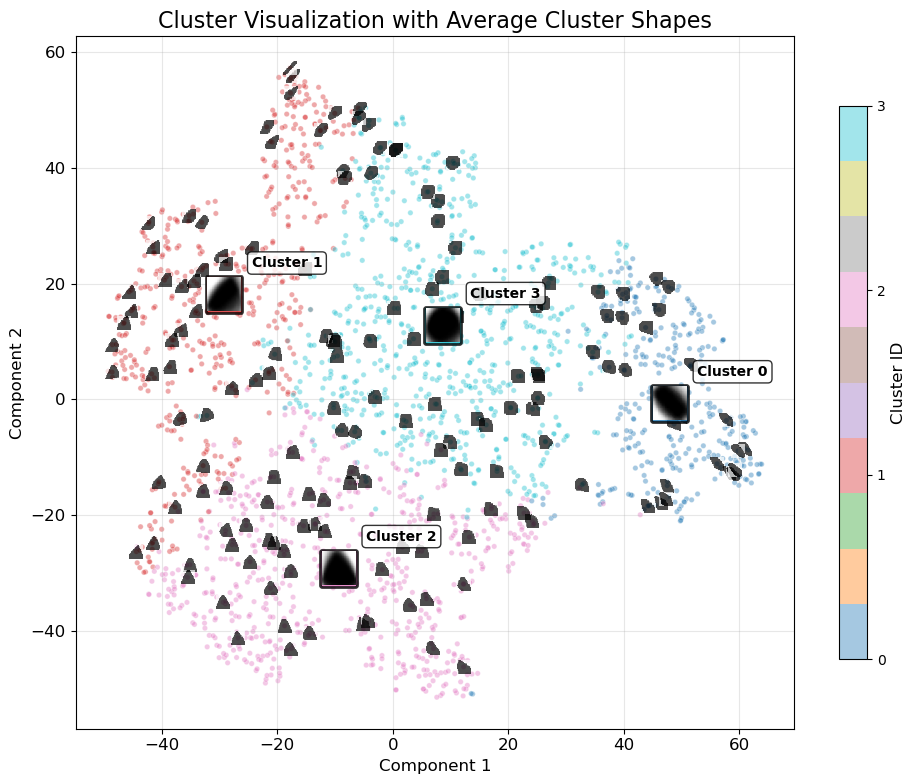


Cluster Statistics:
----------------------------------------
Cluster 0: 342 images (14.5%)
Cluster 1: 542 images (23.0%)
Cluster 2: 695 images (29.5%)
Cluster 3: 779 images (33.0%)


In [31]:
# ==== CLUSTERING ====
X_train = np.array(list_of_images)
flat_X = X_train.reshape(len(X_train), -1)
k = 4 # number of clusters
kmeans = KMeans(n_clusters=k, random_state=40).fit(flat_X)
labels = kmeans.labels_

# ==== COMPUTE CLUSTER AVERAGES ====
cluster_averages = []
cluster_centers_2d = []

# Get original image shape (assuming all images have same shape)
original_shape = X_train[0].shape

for cluster_id in range(k):
    # Find all images belonging to this cluster
    cluster_mask = labels == cluster_id
    cluster_images = X_train[cluster_mask]
    
    # Compute average image for this cluster
    if len(cluster_images) > 0:
        avg_image = np.mean(cluster_images, axis=0)
        cluster_averages.append(avg_image)
    else:
        # Handle empty clusters (shouldn't happen with proper k-means)
        cluster_averages.append(np.zeros(original_shape))

# ==== DIMENSIONALITY REDUCTION ====
# PCA (faster)
#pca = PCA(n_components=2)
#reduced = pca.fit_transform(flat_X)

# Or use t-SNE instead (slower, better local structure)
tsne = TSNE(n_components=2, random_state=40, perplexity=30)
reduced = tsne.fit_transform(flat_X)

# ==== COMPUTE 2D POSITIONS FOR CLUSTER CENTERS ====
# Method 1: Use centroid of cluster points in 2D space
for cluster_id in range(k):
    cluster_mask = labels == cluster_id
    if np.sum(cluster_mask) > 0:
        cluster_points_2d = reduced[cluster_mask]
        center_2d = np.mean(cluster_points_2d, axis=0)
        cluster_centers_2d.append(center_2d)
    else:
        cluster_centers_2d.append([0, 0])

# Alternative Method 2: Transform k-means centroids to 2D space
# This requires fitting the dimensionality reduction on centroids too
# centroids_flat = kmeans.cluster_centers_
# centroids_2d = tsne.fit_transform(np.vstack([flat_X, centroids_flat]))[-k:]

# ==== PLOTTING ====
fig, ax = plt.subplots(figsize=(10, 8))
ax.set_title("Cluster Visualization with Average Cluster Shapes", fontsize=16)

# Show colored points for all data
scatter = ax.scatter(reduced[:, 0], reduced[:, 1], c=labels, cmap='tab10', 
                    s=15, alpha=0.4, edgecolors='white', linewidth=0.5)

# Overlay individual images (subset to avoid clutter)
subset_indices = range(0, len(X_train), max(1, len(X_train)//150))  # Controls you how many example images you see on the plot
for i in subset_indices:
    image = X_train[i]
    im = OffsetImage(image, zoom=0.5, cmap='binary', alpha=0.7)  # Larger size
    ab = AnnotationBbox(im, reduced[i], frameon=False)
    ax.add_artist(ab)

# Overlay cluster average shapes at cluster centers
colors = plt.cm.tab10(np.linspace(0, 1, k))
for cluster_id in range(k):
    avg_image = cluster_averages[cluster_id]
    center_2d = cluster_centers_2d[cluster_id]
    
    # Create average image overlay with distinctive styling
    im = OffsetImage(avg_image, zoom=1.2, cmap='binary', alpha=1.0)  # Larger, B&W, fully opaque
    ab = AnnotationBbox(im, center_2d, frameon=True, 
                       box_alignment=(0.5, 0.5),
                       bboxprops=dict(boxstyle="round,pad=0.1", 
                                    facecolor=colors[cluster_id], 
                                    alpha=0.8, linewidth=2))
    ax.add_artist(ab)
    
    # Add cluster label
    ax.annotate(f'Cluster {cluster_id}', 
               xy=center_2d, xytext=(20, 20), 
               textcoords='offset points',
               fontsize=10, fontweight='bold',
               bbox=dict(boxstyle="round,pad=0.3", facecolor='white', alpha=0.8))

# Add legend explaining the visualization
legend_elements = [
    plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='gray', 
               markersize=8, alpha=0.4, label='Individual Images'),
    plt.Line2D([0], [0], marker='s', color='w', markerfacecolor='purple', 
               markersize=12, label='Cluster Averages')
]
#ax.legend(handles=legend_elements, loc='upper right')

plt.xlabel("Component 1", fontsize=12)
plt.ylabel("Component 2", fontsize=12)
plt.grid(True, alpha=0.3)

# Create colorbar
cbar = plt.colorbar(scatter, ticks=range(k), label="Cluster ID", shrink=0.8)
cbar.ax.tick_params(labelsize=10)

plt.tight_layout()
plt.show()

# ==== OPTIONAL: DISPLAY CLUSTER STATISTICS ====
print("\nCluster Statistics:")
print("-" * 40)
for cluster_id in range(k):
    cluster_size = np.sum(labels == cluster_id)
    print(f"Cluster {cluster_id}: {cluster_size} images ({cluster_size/len(X_train)*100:.1f}%)")

# ==== OPTIONAL: SAVE CLUSTER AVERAGES ====
# Uncomment to save average images
# for cluster_id in range(k):
#     avg_img = cluster_averages[cluster_id]
#     plt.figure(figsize=(4, 4))
#     plt.imshow(avg_img, cmap='gray')
#     plt.title(f'Cluster {cluster_id} Average')
#     plt.axis('off')
#     plt.savefig(f'cluster_{cluster_id}_average.png', bbox_inches='tight', dpi=150)
#     plt.show()

In [32]:
cluster_id_to_check = 2 # The TAD cluster
pos_count = 0
neg_count = 0

for idx, feat in enumerate(SLeNet_ctcf_features_contrastive_bs32_final_normalised_96_test[0]):
    if labels[idx] == cluster_id_to_check:
        if feat[5] == 0:   # gained
            pos_count += 1
        elif feat[5] == 1: # lost
            neg_count += 1

print(f"Cluster {cluster_id_to_check}:")
print(f"  Positives (gained): {pos_count}")
print(f"  Negatives (lost): {neg_count}")
print(f"  Total: {pos_count + neg_count}")

Cluster 2:
  Positives (gained): 68
  Negatives (lost): 627
  Total: 695
